In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, f1_score

from kernel_logistic_regression import KernelLogisticRegression
from logistic_regression import LogisticRegression
import plotly_express as px


In [58]:
X_train.shape, X_val.shape, X_test.shape

((720, 2), (80, 2), (200, 2))

###
#### 1. Settings

In [50]:
parameter = {
    "learning_rate": [0.001, 0.01, 0.033, 0.066, 0.1],
    "gamma": [0.2, 0.5, 0.7, 1, 1.4, 1.7, 2, 4],
    "C": [0.001, 0.01, 0.033, 0.066, 0.1],
    "epoch": 100000
}

In [11]:
def loss_curve(x, y):
    """
    Plot loss_curve as line chart.
        
    x = Number of iterations
    y = Loss per iteration 
        
    """
    fig = px.line(
        x = x, 
        y = y,
        color_discrete_sequence= ["#03658C"],
        template="simple_white",
        width=800,        
        height=400,
        log_x = False
    )
    
    fig.update_yaxes(title_text = "Kreuzentropie Verlust", visible = True)
    fig.update_xaxes(title_text = "Anzahl Iterationen", visible = True)
            
    return fig.show()

In [42]:
from sklearn import datasets

X, y, center = datasets.make_blobs(n_samples=1000, n_features=2, centers=2, center_box = (-2.0, 0.75), random_state=2023, return_centers=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=2023)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.10, random_state=2023)


array([500, 500])

###
#### 2. Kernel Logistic Regression

In [51]:
n_items = len(parameter["learning_rate"]) * len(parameter["gamma"]) * len(parameter["C"])

klgr_model_performance = np.zeros((n_items, 6))
klgr_models = np.zeros((0, 6))

n_iter = 0
for _, lr in enumerate(parameter["learning_rate"]):
    for _, g in enumerate(parameter["gamma"]):
        for _, c in enumerate(parameter["C"]):
            klgr = KernelLogisticRegression(learning_rate = lr, epochs = parameter["epoch"], C = c, gamma = g)
            klgr_model, h = klgr.fit(X_train, y_train)
            klgr_model = klgr_model[:,1].tolist()

            klgr_predictions = klgr.predict(X_val)    
            accuracy = accuracy_score(y_val, klgr_predictions)
            fscore = f1_score(y_val, klgr_predictions)
            klgr_model_performance[n_iter] = [n_iter, lr, accuracy, fscore, g, c]

            n_iter += 1

            print(f"Model training {n_iter} is completed.\n")
        
        #klgr_models = np.concatenate((klgr_models, klgr_model_performance),  axis=0)


The cost after epoch number 0 is: 0.693147
The cost after epoch number 10000 is: 0.335266
The cost after epoch number 20000 is: 0.333407
The cost after epoch number 30000 is: 0.332039
The cost after epoch number 40000 is: 0.33098
The cost after epoch number 50000 is: 0.330136
The cost after epoch number 60000 is: 0.329451
The cost after epoch number 70000 is: 0.328884
The cost after epoch number 80000 is: 0.328409
The cost after epoch number 90000 is: 0.328007
Model training 1 is completed.

The cost after epoch number 0 is: 0.693147
The cost after epoch number 10000 is: 0.335268
The cost after epoch number 20000 is: 0.333409
The cost after epoch number 30000 is: 0.332042
The cost after epoch number 40000 is: 0.330983
The cost after epoch number 50000 is: 0.33014
The cost after epoch number 60000 is: 0.329455
The cost after epoch number 70000 is: 0.328889
The cost after epoch number 80000 is: 0.328415
The cost after epoch number 90000 is: 0.328013
Model training 2 is completed.

The co

In [52]:
klgr_models = pd.DataFrame(columns = ["id", "learning rate", "accuracy", "f1 score", "gamma", "C"], data = klgr_model_performance)
klgr_models.head()

#klgr_models.to_excel("/Users/tanaytuncer/Downloads/klgr_models.xlsx")

In [5]:
klgr = KernelLogisticRegression(learning_rate = 0.01, epochs = parameter["epoch"], gamma = 0.2, C = 0.001)

In [28]:
klgr_model, h = klgr.fit(X_train, y_train)
f"Accuracy: {accuracy_score(y_train, h)} F-Score: {f1_score(y_train, h)}"


The cost after epoch number 0 is: 0.693147
The cost after epoch number 10000 is: 0.329658
The cost after epoch number 20000 is: 0.32895
The cost after epoch number 30000 is: 0.328832
The cost after epoch number 40000 is: 0.328807
The cost after epoch number 50000 is: 0.3288
The cost after epoch number 60000 is: 0.328797
The cost after epoch number 70000 is: 0.328795
The cost after epoch number 80000 is: 0.328794
The cost after epoch number 90000 is: 0.328793


'Accuracy: 0.8597222222222223 F-Score: 0.8563300142247511'

In [29]:
klgr_val = klgr.predict(X_val)
f"Accuracy: {accuracy_score(y_val, klgr_val)} F-Score: {f1_score(y_val, klgr_val)}"


'Accuracy: 0.7375 F-Score: 0.7961165048543689'

In [30]:
klgr_model, h = klgr.fit(np.concatenate((X_train, X_val), axis=0), np.concatenate((y_train, y_val)))

klgr_test = klgr.predict(X_test)
f"Accuracy: {accuracy_score(y_test, klgr_test)} F-Score: {f1_score(y_test, klgr_test)}"


The cost after epoch number 0 is: 0.693147
The cost after epoch number 10000 is: 0.319422
The cost after epoch number 20000 is: 0.318759
The cost after epoch number 30000 is: 0.318649
The cost after epoch number 40000 is: 0.318625
The cost after epoch number 50000 is: 0.318617
The cost after epoch number 60000 is: 0.318614
The cost after epoch number 70000 is: 0.318611
The cost after epoch number 80000 is: 0.318609
The cost after epoch number 90000 is: 0.318607


'Accuracy: 0.32 F-Score: 0.3061224489795918'

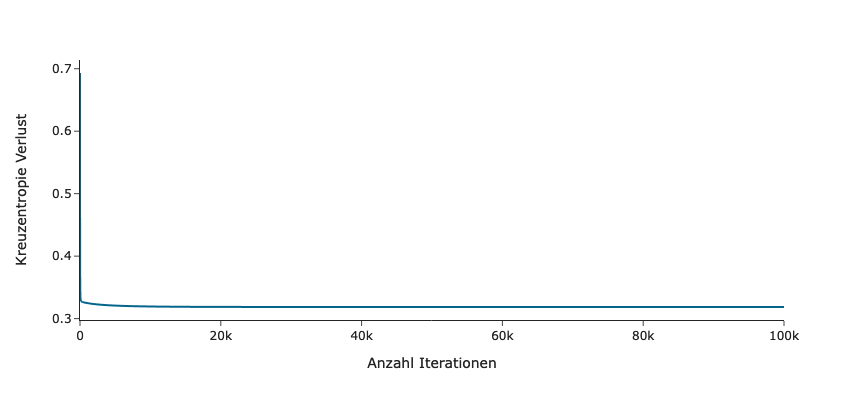

In [12]:
loss_curve(x = klgr_model[:,0], y = klgr_model[:,1])

In [166]:
print(classification_report(y_test, klgr_h, target_names=["ham", "spam"], zero_division = 0))

              precision    recall  f1-score   support

         ham       0.30      0.37      0.33        92
        spam       0.34      0.28      0.31       108

    accuracy                           0.32       200
   macro avg       0.32      0.32      0.32       200
weighted avg       0.32      0.32      0.32       200



###
#### 3. Logistic Regression

In [68]:
n_items = len(parameter["learning_rate"]) * len(parameter["C"])

lgr_model_performance = np.zeros((n_items, 5))

n_iter = 0
for i, lr in enumerate(parameter["learning_rate"]):
    for j, c in enumerate(parameter["C"]):

        lgr = LogisticRegression(learning_rate = lr, epochs = parameter["epoch"], reg = True, C = c)
        lgr_model, h = lgr.fit(X_train, y_train)
        lgr_model = lgr_model[:,1].tolist()

        lgr_predictions = lgr.predict(X_val)    
        accuracy = accuracy_score(y_val, lgr_predictions)
        fscore = f1_score(y_val, lgr_predictions)
        lgr_model_performance[n_iter] = [n_iter, lr, accuracy, fscore, c]

        n_iter += 1

        print(f"Model training {n_iter} of {n_items} is completed.\n")
        

The cost after epoch number 0 is: 1.172349
The cost after epoch number 10000 is: 0.353388
The cost after epoch number 20000 is: 0.334352
The cost after epoch number 30000 is: 0.328955
The cost after epoch number 40000 is: 0.326871
The cost after epoch number 50000 is: 0.325961
The cost after epoch number 60000 is: 0.325537
The cost after epoch number 70000 is: 0.32533
The cost after epoch number 80000 is: 0.325225
The cost after epoch number 90000 is: 0.325169
1
Model training 1 of 25 is completed.

The cost after epoch number 0 is: 0.838798
The cost after epoch number 10000 is: 0.35026
The cost after epoch number 20000 is: 0.333629
The cost after epoch number 30000 is: 0.328735
The cost after epoch number 40000 is: 0.326825
The cost after epoch number 50000 is: 0.325989
The cost after epoch number 60000 is: 0.3256
The cost after epoch number 70000 is: 0.325409
The cost after epoch number 80000 is: 0.325313
The cost after epoch number 90000 is: 0.325262
2
Model training 2 of 25 is comp

In [72]:
lgr_model_performance = pd.DataFrame(columns = ["id", "learning rate", "accuracy", "f1 score", "C"], data = lgr_model_performance)
#lgr_model_performance.to_excel("/Users/tanaytuncer/Downloads/lgr_models.xlsx")

,id,learning rate,accuracy,f1 score,C
0,0.0,0.001,0.9000,0.900000,0.001
1,1.0,0.001,0.9000,0.900000,0.010
2,2.0,0.001,0.9000,0.900000,0.033
3,3.0,0.001,0.9000,0.900000,0.066
4,4.0,0.001,0.9000,0.900000,0.100
5,5.0,0.010,0.9125,0.911392,0.001
6,6.0,0.010,0.9125,0.911392,0.010
7,7.0,0.010,0.9125,0.911392,0.033
8,8.0,0.010,0.9125,0.911392,0.066
9,9.0,0.010,0.9125,0.911392,0.100


In [14]:
lgr = LogisticRegression(learning_rate = 0.01, reg = True, epochs = parameter["epoch"], C = 0.1)

In [20]:
lgr_model, lghr_h = lgr.fit(X_train, y_train)
f"Accuracy: {accuracy_score(y_train, lghr_h)} F-Score: {f1_score(y_train, lghr_h)}"

The cost after epoch number 0 is: 1.07015
The cost after epoch number 10000 is: 0.328261
The cost after epoch number 20000 is: 0.328199
The cost after epoch number 30000 is: 0.328199
The cost after epoch number 40000 is: 0.328199
The cost after epoch number 50000 is: 0.328199
The cost after epoch number 60000 is: 0.328199
The cost after epoch number 70000 is: 0.328199
The cost after epoch number 80000 is: 0.328199
The cost after epoch number 90000 is: 0.328199


'Accuracy: 0.8583333333333333 F-Score: 0.853868194842407'

In [21]:
lgr_val = lgr.predict(X_val)
f"Accuracy: {accuracy_score(y_val, lgr_val)} F-Score: {f1_score(y_val, lgr_val)}"

'Accuracy: 0.9125 F-Score: 0.9113924050632912'

In [22]:
lgr_model,lghr_h = lgr.fit(np.concatenate((X_train, X_val), axis=0), np.concatenate((y_train, y_val)))
lgr_test = lgr.predict(X_test)

f"Accuracy: {accuracy_score(y_test, lgr_test)} F-Score: {f1_score(y_test, lgr_test)}"


The cost after epoch number 0 is: 1.215526
The cost after epoch number 10000 is: 0.3192
The cost after epoch number 20000 is: 0.319129
The cost after epoch number 30000 is: 0.319128
The cost after epoch number 40000 is: 0.319128
The cost after epoch number 50000 is: 0.319128
The cost after epoch number 60000 is: 0.319128
The cost after epoch number 70000 is: 0.319128
The cost after epoch number 80000 is: 0.319128
The cost after epoch number 90000 is: 0.319128


'Accuracy: 0.895 F-Score: 0.9014084507042254'

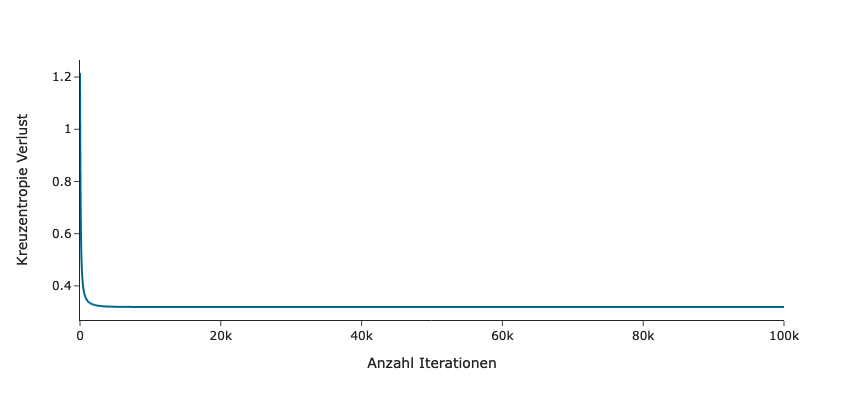

In [23]:
loss_curve(x = lgr_model[:,0], y = lgr_model[:,1])

In [27]:
print(classification_report(y_test, lgr_test, target_names=["ham", "spam"]))

              precision    recall  f1-score   support

         ham       0.87      0.90      0.89        92
        spam       0.91      0.89      0.90       108

    accuracy                           0.90       200
   macro avg       0.89      0.90      0.89       200
weighted avg       0.90      0.90      0.90       200

